In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from connect_mongo import connect_to_mongo 

In [2]:
collections= ["fincaraiz", "properati", "metrocuadrado", "ciencuadras"]
df = connect_to_mongo("propiedades", collections)

para facilitar al analisis de los datos se tomo los datos solo de ciencuadras

In [3]:
print(df['from'].value_counts())

from
Ciencuadras    9722
Name: count, dtype: int64


In [4]:

print("\nEstadísticas de precios por metro cuadrado:")
print(df['area_price_rent'].describe())


Estadísticas de precios por metro cuadrado:
count      9722.000000
mean      53062.732638
std       33594.081726
min          50.000000
25%       29090.909091
50%       44766.790449
75%       69071.904762
max      300000.000000
Name: area_price_rent, dtype: float64


In [5]:
df = df[(df["area_price_rent"] <= 200000) & (df["area_price_rent"] >= 5000 )].reset_index(drop=True)

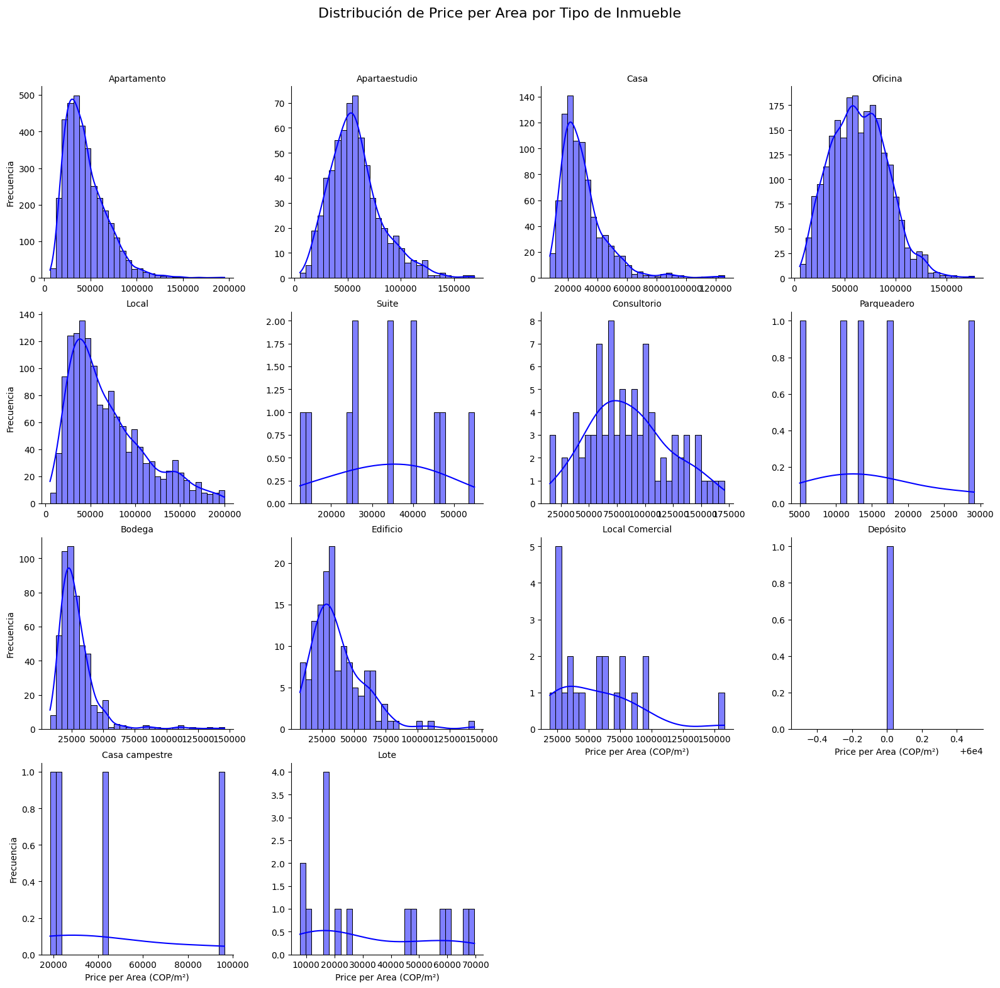

In [6]:
g = sns.FacetGrid(df, col='technicalSheet_property_type_name', col_wrap=4, height=4, sharex=False, sharey=False)

# Dibujar los histogramas
g.map(sns.histplot, 'area_price_rent', bins=30, kde=True, color='blue')

# Configuración de los gráficos
g.set_titles("{col_name}")
g.set_axis_labels("Price per Area (COP/m²)", "Frecuencia")
g.figure.subplots_adjust(top=0.9)
g.figure.suptitle("Distribución de Price per Area por Tipo de Inmueble", fontsize=16)
#g.set_xticklabels(rotation=45)
# Mostrar los gráficos
plt.show()

In [7]:
if 'technicalSheet_property_type_name' in df.columns:
    print("\nTipo de inmuebles:")
    print(df['technicalSheet_property_type_name'].value_counts())


Tipo de inmuebles:
technicalSheet_property_type_name
Apartamento        3575
Oficina            2320
Local              1484
Casa                843
Apartaestudio       643
Bodega              503
Edificio            140
Consultorio          84
Local Comercial      22
Lote                 15
Suite                12
Parqueadero           5
Casa campestre        4
Depósito              1
Name: count, dtype: int64


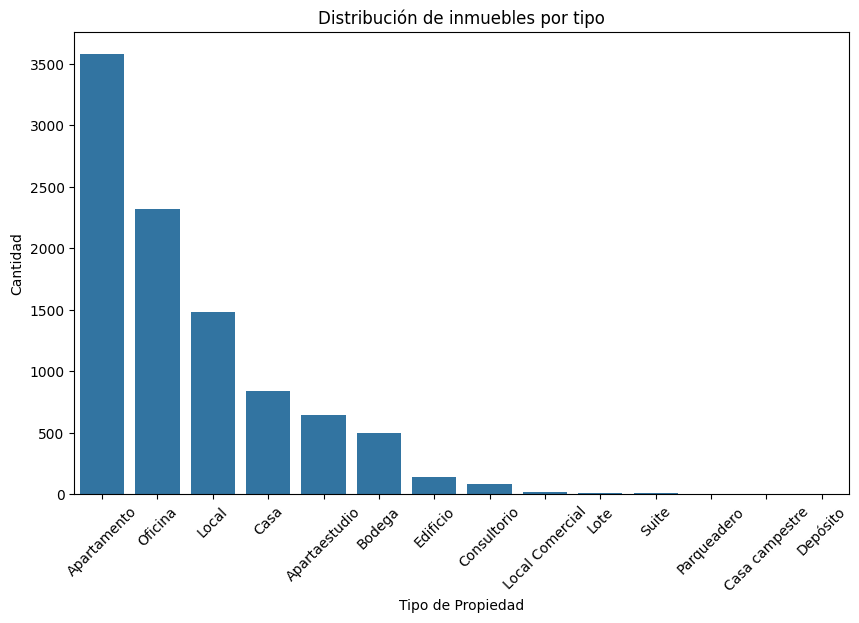

In [8]:
if 'technicalSheet_property_type_name' in df.columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x='technicalSheet_property_type_name', order=df['technicalSheet_property_type_name'].value_counts().index)
    plt.title('Distribución de inmuebles por tipo')
    plt.xlabel('Tipo de Propiedad')
    plt.ylabel('Cantidad')
    plt.xticks(rotation=45)
    plt.show()

In [9]:
if 'location_localidad' in df.columns:
    print("\nInmuebles por localidad:")
    print(df['location_localidad'].value_counts())


Inmuebles por localidad:
location_localidad
chapinero             2298
usaquén               1708
suba                  1203
fontibón               652
engativá               606
barrios unidos         542
teusaquillo            517
santa fe               516
kennedy                378
puente aranda          294
los mártires           181
otra                   170
antonio nariño         123
la candelaria          121
ciudad bolívar          92
bosa                    90
rafael uribe uribe      88
usme                    39
san cristóbal           33
Name: count, dtype: int64


In [10]:

promedios_por_localidad = df.groupby('location_localidad').agg({
    'area': 'mean',  
    'area_price_rent': 'mean'
}).reset_index().sort_values(by='area_price_rent', ascending=False) 
promedios_por_localidad = promedios_por_localidad.rename(columns={
    'area': 'area_promedio',    
    'area_price_rent': 'precio_por_area_promedio'
})

print(promedios_por_localidad)

    location_localidad  area_promedio  precio_por_area_promedio
3            chapinero     213.389482              69607.448293
17             usaquén     182.689169              56813.836883
14            santa fe     228.445504              54746.701651
4       ciudad bolívar     163.354891              53047.557830
10                otra     279.722176              50611.385174
1       barrios unidos     203.421937              50350.016811
16         teusaquillo     193.661992              47020.659579
15                suba     193.700831              45718.334640
6             fontibón     500.281595              44412.565377
18                usme      76.395897              43778.146002
9         los mártires     103.535138              43312.278284
0       antonio nariño     192.048618              42400.294082
8        la candelaria     248.572645              39949.411023
5             engativá     244.447987              35323.852775
11       puente aranda     588.547755   

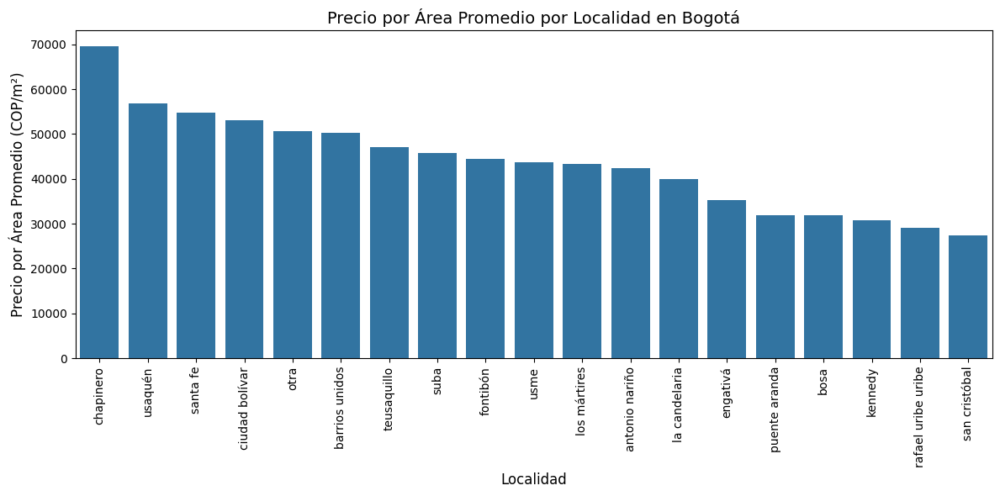

In [11]:
plt.figure(figsize=(12, 6))
sns.barplot(data=promedios_por_localidad, x='location_localidad', y='precio_por_area_promedio')

plt.title('Precio por Área Promedio por Localidad en Bogotá', fontsize=14)
plt.xlabel('Localidad', fontsize=12)
plt.ylabel('Precio por Área Promedio (COP/m²)', fontsize=12)
plt.xticks(rotation=90) 

plt.tight_layout()
plt.show()

In [12]:
stratum_order = ['1', '2', '3', '4', '5', '6']
df['technicalSheet_stratum'] = pd.Categorical(
    df['technicalSheet_stratum'],
    categories=stratum_order,
    ordered=True
)

In [13]:
promedios_por_stratum = df.groupby('technicalSheet_stratum').agg(
    area_promedio=('area', 'mean'),
    precio_por_area_promedio=('area_price_rent', 'mean'),
    conteo=('technicalSheet_stratum', 'size')
).reset_index().sort_values(by='precio_por_area_promedio', ascending=False)

print(promedios_por_stratum)

  technicalSheet_stratum  area_promedio  precio_por_area_promedio  conteo
5                      6     248.014077              68822.420977    2092
4                      5     200.669730              63281.494966    1405
3                      4     175.679128              49818.796734    2294
0                      1     307.010727              46946.708893      55
2                      3     274.992272              40198.212386    3257
1                      2      99.619178              29036.536200     365


/tmp/ipykernel_20548/2061454439.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  promedios_por_stratum = df.groupby('technicalSheet_stratum').agg(


- se descubre una relacion entre el estrato y el precio por area, es extraño ver que el estrato 1 no sigue la tendencia, puede deberse a la ubicacion especifica de los predios o un error en los datos

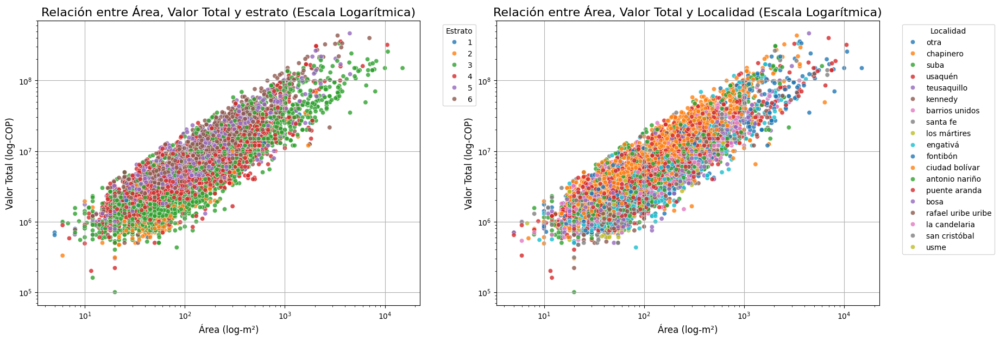

In [14]:
if 'area' in df.columns and 'costs_total_amount' in df.columns and 'technicalSheet_stratum' in df.columns:
    df_filtered = df[['area', 'costs_total_amount', 'technicalSheet_stratum', ]].dropna()
    plt.figure(figsize=(20, 15))

    plt.subplot(2, 2, 1)
    sns.scatterplot(
    data=df,
    x='area',
    y='costs_total_amount',
    hue='technicalSheet_stratum',
    palette='tab10',
    alpha=0.8
)
    plt.title('Relación entre Área, Valor Total y estrato (Escala Logarítmica)', fontsize=16)
    plt.xlabel('Área (log-m²)', fontsize=12)
    plt.ylabel('Valor Total (log-COP)', fontsize=12)
    plt.legend(title='Estrato', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    

    plt.xscale('log')
    plt.yscale('log')

    plt.subplot(2, 2, 2)
    sns.scatterplot(
    data=df,
    x='area',
    y='costs_total_amount',
    hue='location_localidad',
    palette='tab10',
    alpha=0.8
)

    plt.xscale('log')
    plt.yscale('log')
    plt.title('Relación entre Área, Valor Total y Localidad (Escala Logarítmica)', fontsize=16)
    plt.xlabel('Área (log-m²)', fontsize=12)
    plt.ylabel('Valor Total (log-COP)', fontsize=12)
    plt.legend(title='Localidad', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.show()
else:
    print("Faltan columnas necesarias ('area', 'costs_total_amount', 'location_localidad') para la gráfica.")

In [15]:
import folium
from folium.plugins import MarkerCluster


# Filtrar los datos necesarios
columns = ['latitude', 'longitude', 'price_per_area']
filtered_data = df[['location_latitude', 'location_longitude', 'area_price_rent']].dropna()
filtered_data.columns = columns  


map_bogota = folium.Map(location=[4.65, -74.1], zoom_start=11)

marker_cluster = MarkerCluster().add_to(map_bogota)


for _, row in filtered_data.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        tooltip=f"Precio/Área: {row['price_per_area']:.2f}"
    ).add_to(marker_cluster)

map_bogota

/tmp/ipykernel_20548/1165545271.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


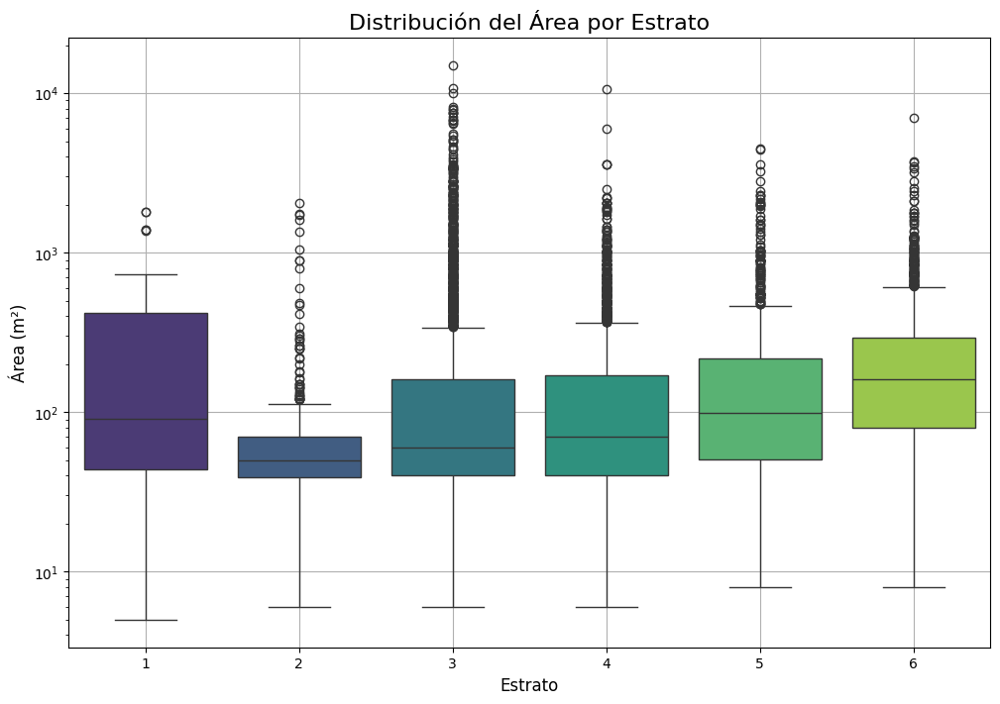

In [16]:
if 'area' in df.columns and 'costs_total_amount' in df.columns and 'technicalSheet_stratum' in df.columns:
    df_filtered = df[['area', 'costs_total_amount', 'technicalSheet_stratum']].dropna()

    plt.figure(figsize=(12, 8))
    sns.boxplot(
    data=df_filtered,
    x='technicalSheet_stratum',
    y='area',
    palette='viridis'
)
    
    plt.yscale('log')
    plt.title('Distribución del Área por Estrato', fontsize=16)
    plt.xlabel('Estrato', fontsize=12)
    plt.ylabel('Área (m²)', fontsize=12)
    plt.grid(True)
    plt.show()
else:
    print("Faltan columnas necesarias ('area', 'costs_total_amount', 'technicalSheet_stratum') para la gráfica.")

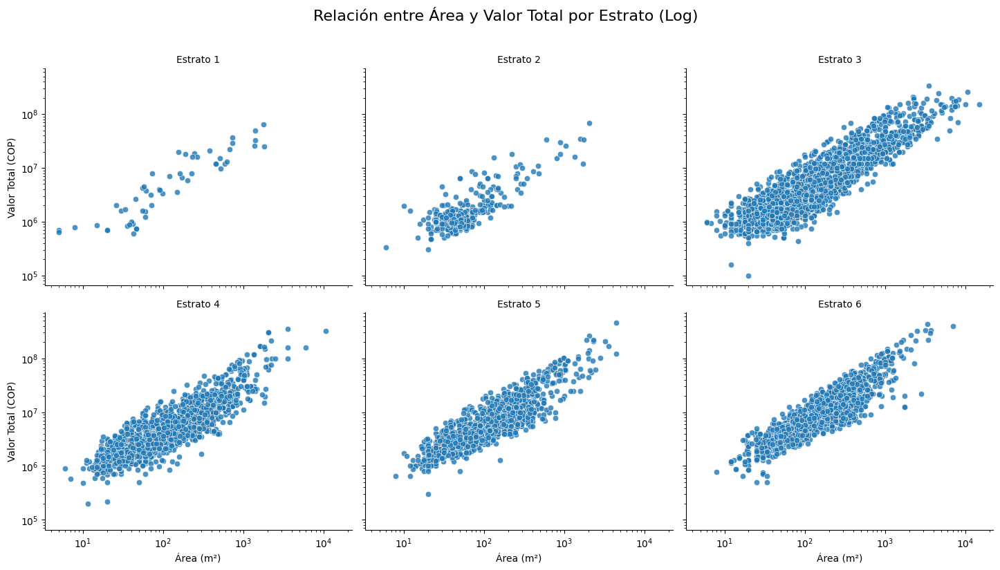

In [17]:
if 'area' in df.columns and 'costs_total_amount' in df.columns and 'technicalSheet_stratum' in df.columns:
    df_filtered = df[['area', 'costs_total_amount', 'technicalSheet_stratum']].dropna()
    g = sns.FacetGrid(df_filtered, col="technicalSheet_stratum", col_wrap=3, height=4, aspect=1.2)
    g.map(sns.scatterplot, "area", "costs_total_amount", alpha=0.8)
    g.set_axis_labels("Área (m²)", "Valor Total (COP)")
    g.set_titles("Estrato {col_name}")
    g.fig.suptitle("Relación entre Área y Valor Total por Estrato (Log)", fontsize=16, y=1.02)
    g.tight_layout()
    plt.xscale('log')
    plt.yscale('log')
    plt.show()
else:
    print("Faltan columnas necesarias ('area', 'costs_total_amount', 'technicalSheet_stratum') para la gráfica.")

/tmp/ipykernel_20548/2009300184.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


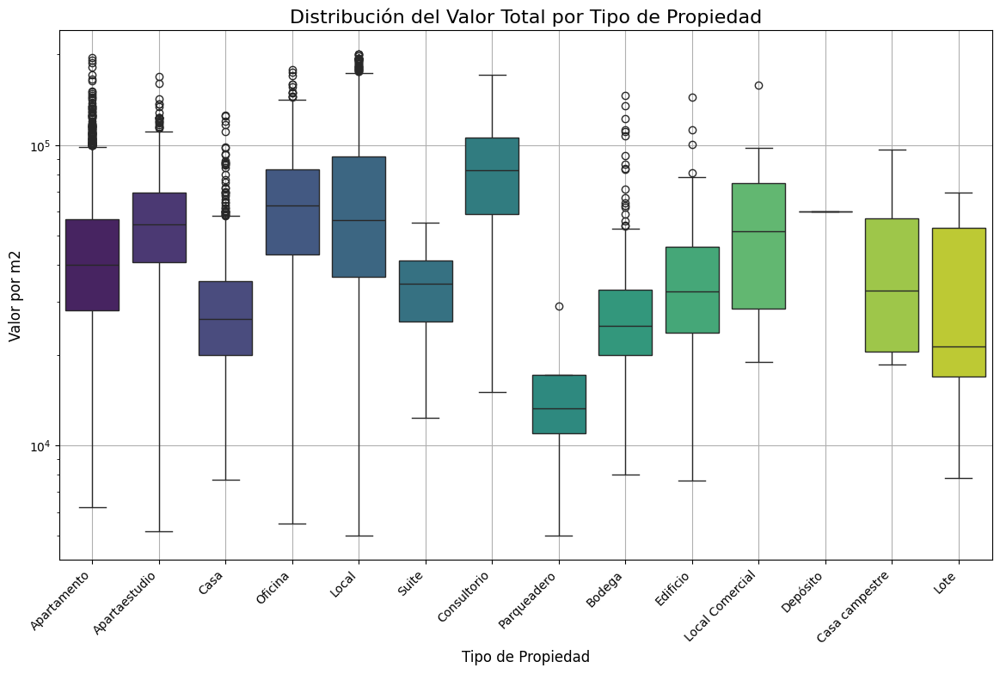

In [18]:

plt.figure(figsize=(14, 8))

# Create the box plot
sns.boxplot(
    data=df,
    x='technicalSheet_property_type_name',  # Replace with your actual column name for property type
    y='area_price_rent',  # Replace with your total amount column
    palette='viridis'
)

# Set titles and labels
 
plt.yscale('log')
plt.title('Distribución del Valor Total por Tipo de Propiedad', fontsize=16)
plt.xlabel('Tipo de Propiedad', fontsize=12)
plt.ylabel('Valor por m2', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.grid(True)
plt.show()

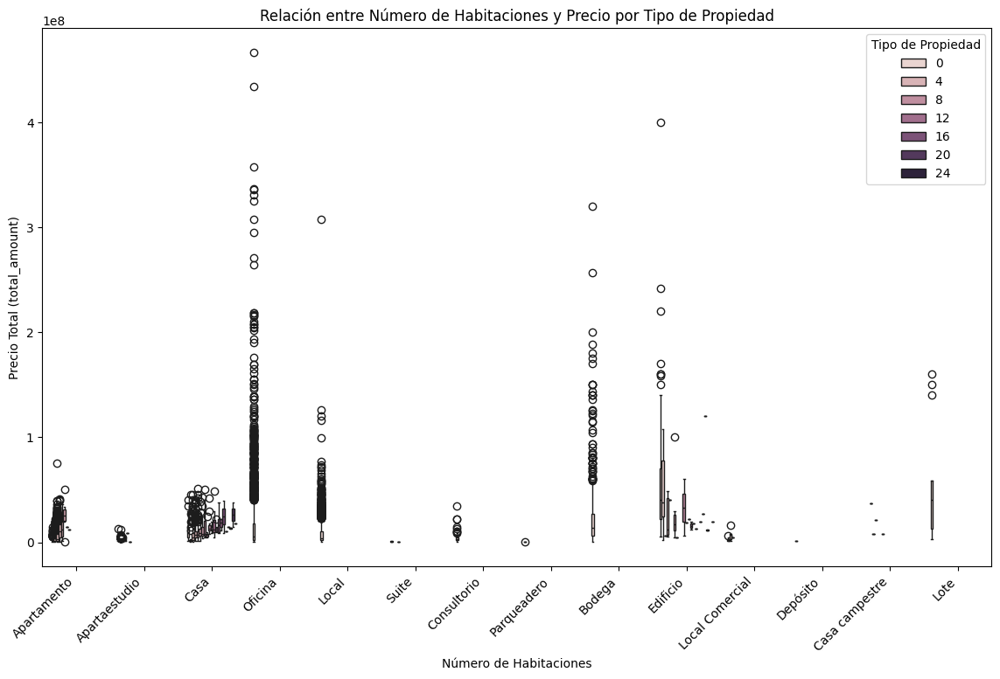

In [19]:
plt.figure(figsize=(14, 8))

# Boxplot segmentado
sns.boxplot(data=df, x='technicalSheet_property_type_name', y='costs_total_amount', hue='technicalSheet_bedrooms')

plt.title("Relación entre Número de Habitaciones y Precio por Tipo de Propiedad")
plt.xlabel("Número de Habitaciones")
plt.ylabel("Precio Total (total_amount)")
plt.legend(title="Tipo de Propiedad", loc="upper right")
plt.xticks(rotation=45, ha='right') 
plt.show()

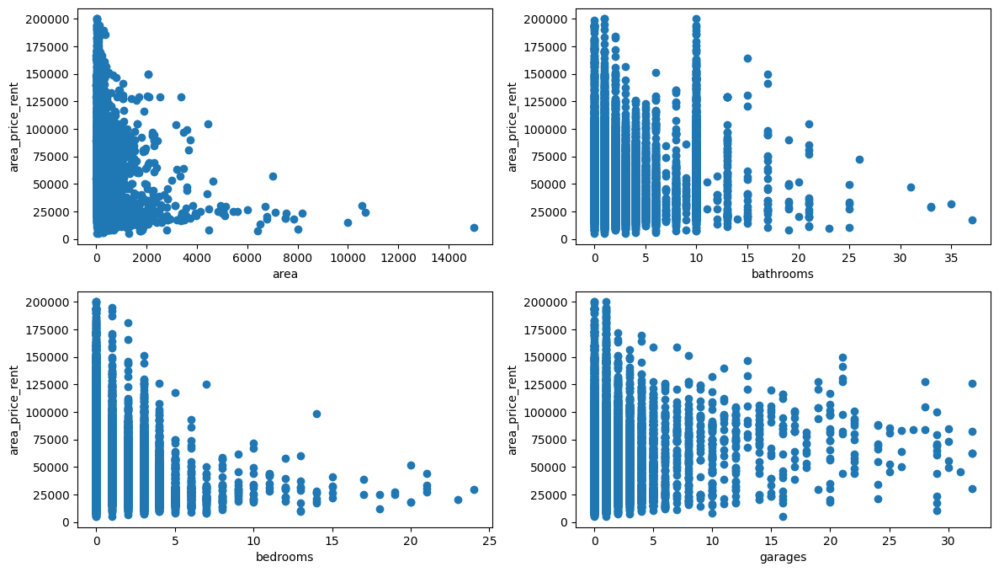

In [20]:
plt.figure(figsize=(14, 8))

plt.subplot(2, 2, 1)
plt.scatter(x=df["area"], y=df["area_price_rent"])
plt.xlabel("area")
plt.ylabel("area_price_rent")

plt.subplot(2, 2, 2)
plt.scatter(x=df["technicalSheet_bathrooms"], y=df["area_price_rent"])
plt.xlabel("bathrooms")
plt.ylabel("area_price_rent")

plt.subplot(2, 2, 3)
plt.scatter(x=df["technicalSheet_bedrooms"], y=df["area_price_rent"])
plt.xlabel("bedrooms")
plt.ylabel("area_price_rent")

plt.subplot(2, 2, 4)
plt.scatter(x=df["technicalSheet_garage"], y=df["area_price_rent"])
plt.xlabel("garages")
plt.ylabel("area_price_rent")

plt.savefig("scatterplots.png", bbox_inches="tight")
plt.show()

In [21]:
unique_property_types = df['technicalSheet_property_type_name'].unique()

# Mostrar los valores únicos
print("Valores únicos de 'technicalSheet_property_type_name':")
print(unique_property_types)

Valores únicos de 'technicalSheet_property_type_name':
['Apartamento' 'Apartaestudio' 'Casa' 'Oficina' 'Local' 'Suite'
 'Consultorio' 'Parqueadero' 'Bodega' 'Edificio' 'Local Comercial'
 'Depósito' 'Casa campestre' 'Lote']


/home/sag/Documents/pythonProjects/arriendo_bogota_notebook/venv/lib/python3.12/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sag/Documents/pythonProjects/arriendo_bogota_notebook/venv/lib/python3.12/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


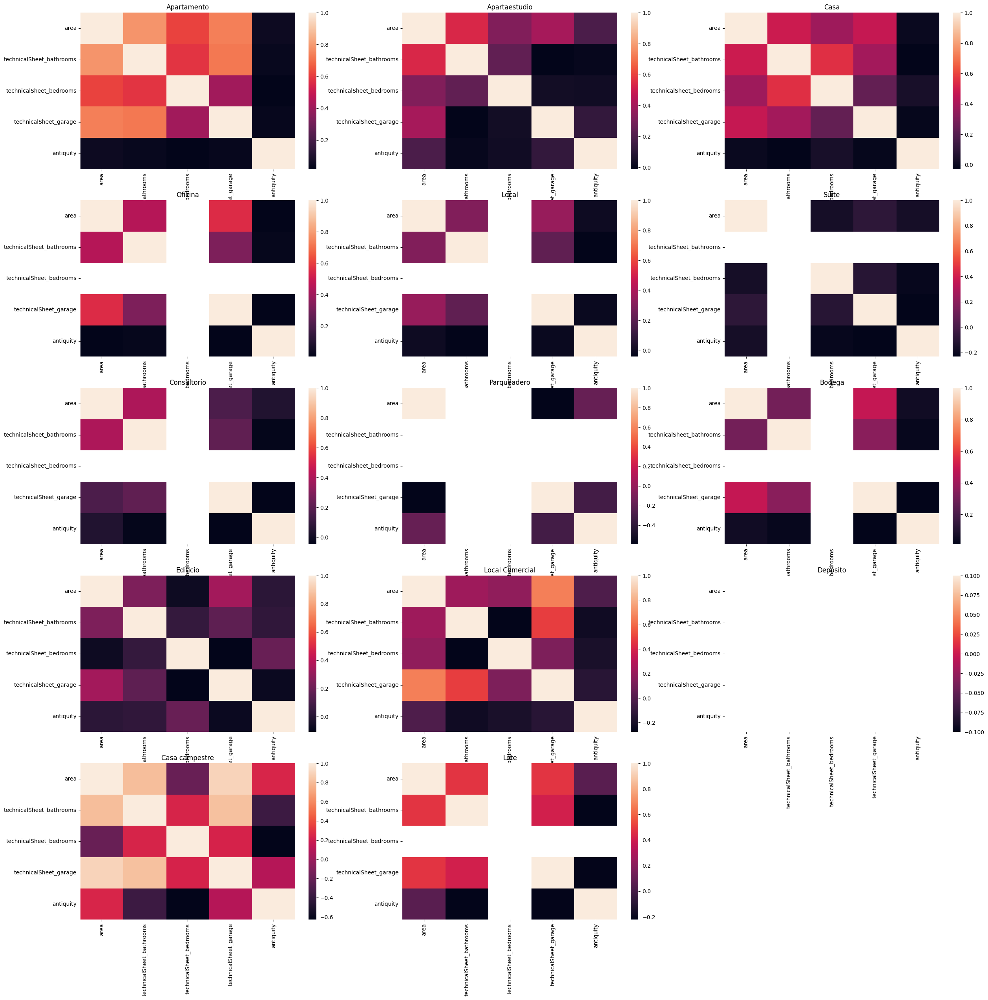

In [22]:
property_type_filter = ['Apartamento', 'Apartaestudio', 'Casa', 'Oficina', 'Local', 'Suite',
 'Consultorio', 'Parqueadero', 'Bodega', 'Edificio', 'Local Comercial',
 'Depósito', 'Casa campestre', 'Lote']

plt.figure(figsize=(30,30))
for i, pt in enumerate(property_type_filter): 
    filtered_df = df[df['technicalSheet_property_type_name'] == pt]

    # Selección de columnas específicas
    selected_columns = ['area', 'technicalSheet_bathrooms', 'technicalSheet_bedrooms', 'technicalSheet_garage', 'antiquity']
    filtered_columns_df = filtered_df[selected_columns]

    corr = filtered_columns_df.corr()
    plt.subplot(5, 3, i+1)
    plt.title(pt)
    fig = sns.heatmap(corr, 
                xticklabels=corr.columns.values,
                yticklabels=corr.columns.values)

    #fig.get_figure().savefig("corr_heatmap.png", bbox_inches="tight") 